## **Predstavljanje Projekta**

Projekat iz Masinkog ucenja.

Cilj je klasifikacija 12 vrsta semena biljaka iz Danske.

## **O dataset-u**

Dataset poznat kao "V2 Plant Seedlings Dataset" sa Kaggle website-a, moze da se skine sa sledece web adrese [ovde](https://www.kaggle.com/datasets/vbookshelf/v2-plant-seedlings-dataset/data). Dataset se sajstoji od bogate kolekcije slika 5,539 fotografija semena i biljaka u razlicitim stepenima razvoja. Slike prikazane u RGB formatu u razlicitim velicinama pazljivo klasifikovane u 12 klasa. Svaka klasa simbolizuje biljku koja je uobicajna u Holandiji.

## **Pristup**

Imamo pet glavnih poglavlja:

**1. Priprema Podataka:** Prikazujmo podatke i analiziramo, procesiramo dataset, priprema za ML analizu.

**2. Gradimo Model:** Konstruisemo model za ML koji najbolje odgovara nasoj klasifikaciji.

**3. Trening Modela i Evaluacija:** Treniranje i evaluacija.

**4. Evaluacija Modela:** Evaluacija modela koriscenjem raznih metrika.

**5. Rezultati i Vizualizacija Rezulata:** Vizualizacija ishoda, intepretacija predikcije modela i konacna evaulacija rezulata.

## **Korak 1: Priprema podataka**

Istrazivanje podataka i pretvaranje u odgovarajuci format za model masinkog ucenja.

In [166]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import lr_scheduler
from PIL import Image
from torchvision.datasets import ImageFolder
from skimage.io import imread
from torch.utils.data import DataLoader, random_split, Dataset
from torchvision import transforms
from torchvision import models 
from sklearn.metrics import classification_report, confusion_matrix
import time
import copy
from tqdm import tqdm

In [116]:
# Put do dataseta
dataset_path = "NonsegmentedV2/"
subfolders = [
    f.name for f in os.scandir("plant-seedlings-classification/train") if f.is_dir()
]
print("Categories:", subfolders)

Categories: ['Black-grass', 'Charlock', 'Cleavers', 'Common Chickweed', 'Common wheat', 'Fat Hen', 'Loose Silky-bent', 'Maize', 'Scentless Mayweed', 'Shepherds Purse', 'Small-flowered Cranesbill', 'Sugar beet']


In [117]:
# Funkcija da prikaze tri slike iz svake kategorije
def load_sample_images(path, categories, num_samples=3):
    sample_images = {}
    for category in categories:
        folder_path = os.path.join(path, category)
        image_files = [
            file for file in os.listdir(folder_path) if file.endswith(".png")
        ]
        sample_images[category] = [
            imread(os.path.join(folder_path, file))
            for file in image_files[:num_samples]
        ]
    return sample_images

In [118]:
# Uzorak slika
sample_images = load_sample_images("plant-seedlings-classification/train", subfolders)

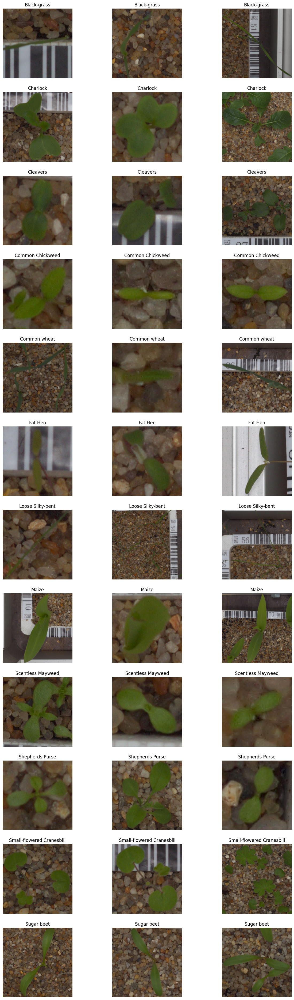

In [119]:
# Plotovanje
fig, axarr = plt.subplots(len(subfolders), 3, figsize=(15, 4 * len(subfolders)))
for i, category in enumerate(subfolders):
    for j in range(3):
        axarr[i, j].imshow(sample_images[category][j])
        axarr[i, j].axis("off")
        axarr[i, j].set_title(category)


plt.show()

In [133]:
# Prilagodjena dataset klasa
class PlantSeedDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_folder = ImageFolder(root=self.root_dir, transform=self.transform)

    def __len__(self):
        return len(self.image_folder)

    def __getitem__(self, index):
        image, label = self.image_folder[index]

        if self.transform is not None:
            # Proveri da li je tenzor, ako nije uradi transformacije
            if not isinstance(image, torch.Tensor):
                image = self.transform(image)

        return image, label

## **Korak 2: Gradnja Modela**

Sada cemo da odaberemo i konstruisemo ML model. 
Koristicemo unapred istrenirani PyTorch model ResNet18 koji cemo prilagoditi nasim potrebama klasifikacije.
To podrazumeva postavljanje arhitekture modela i konfigurisanje da rasava nas problem klasifikacije.

In [134]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Transformacije slike
transform = transforms.Compose(
    [
        transforms.Resize(size=(224, 224)),  # Velicina slika 224x224
        transforms.ToTensor(),  # Konvertuj slike u tenzor
        transforms.Normalize(  # Normalizacija slika
            mean=[0.485, 0.456, 0.406],  # Mean and Std za ImageNet dataset
            std=[0.229, 0.224, 0.225],
        ),
    ]
)

# Dataset sa transformacijama
dataset_path = "NonsegmentedV2/"
dataset = PlantSeedDataset(root_dir=dataset_path, transform=transform)

In [150]:
# Podela dataseta na trening + validacija i test set
train_val_size = int(0.8 * len(dataset))  # 80% trening + validacija
test_size = len(dataset) - train_val_size
train_val_dataset, test_dataset = random_split(dataset, [train_val_size, test_size])

# Podela trening + validacija seta na training set i validacija
train_size = int(0.7 * len(train_val_dataset))  # 70% od train_val_dataset za trening
validation_size = len(train_val_dataset) - train_size
train_dataset, validation_dataset = random_split(
    train_val_dataset, [train_size, validation_size]
)

In [155]:
# Dataloaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

In [167]:
# Model
class PlantSeedingModelResNet18(nn.Module):
    def __init__(self, num_classes=1000):
        super(PlantSeedingModelResNet18, self).__init__()
        resnet18 = models.resnet18(weights="DEFAULT")
        resnet18.fc = nn.Linear(in_features=resnet18.fc.in_features, out_features=num_classes)
        self.resnet18 = resnet18

    def forward(self, x):
        return self.resnet18(x)

In [168]:
 model = PlantSeedingModelResNet18(num_classes=12)

In [169]:
model = model.to(device)

In [170]:
# Funkcija greske i optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [171]:
# Prikazi strukturu modela
print(model)

PlantSeedingModelResNet18(
  (resnet18): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, aff

## **Step 3: Trening Modela i Validacija**
Treniramo model na utreniranom datasetu. Hranimo model podacima, namestamo tezine modela pomocu odabrane funkcije greske plus koristimo optimizer. Na kraju, validiramo performanse modela na podskupu podataka da osiguramo efektivnost.

In [172]:
# Broj epoha
num_epochs = 25

scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1) # Algoritam koji azurira learning rate u optimizeru

In [173]:
train_losses, val_losses = [], []
train_accs, val_accs = [], []


def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 10)

        # Each epoch has a training and validation phase
        for phase in ["train", "val"]:
            if phase == "train":
                model.train()  # Set model to training mode
            else:
                model.eval()  # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward
                with torch.set_grad_enabled(phase == "train"):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == "train":
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == "train" and scheduler:
                scheduler.step()

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            # Save the metrics
            if phase == "train":
                train_losses.append(epoch_loss)
                train_accs.append(
                    epoch_acc.cpu().item()
                )  # Detach from GPU and convert to Python number
            else:
                val_losses.append(epoch_loss)
                val_accs.append(
                    epoch_acc.cpu().item()
                )  # Detach from GPU and convert to Python number

            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

            # Deep copy the model
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f"Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")
    print(f"Best val Acc: {best_acc:.4f}")

    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [174]:
# Priprema datalodera
dataloaders = {"train": train_loader, "val": validation_loader}

In [175]:
# Treniraj i validiraj model
model_ft = train_model(model, criterion, optimizer, scheduler, num_epochs=num_epochs)

Epoch 1/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [12:49<00:00,  7.93s/it]


train Loss: 0.8187 Acc: 0.7243


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.75s/it]


val Loss: 0.9601 Acc: 0.7158

Epoch 2/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:53<00:00,  7.35s/it]


train Loss: 0.3943 Acc: 0.8568


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.7463 Acc: 0.7496

Epoch 3/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:54<00:00,  7.36s/it]


train Loss: 0.3144 Acc: 0.8894


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.7093 Acc: 0.7647

Epoch 4/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:55<00:00,  7.38s/it]


train Loss: 0.3160 Acc: 0.8865


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.4635 Acc: 0.8331

Epoch 5/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:54<00:00,  7.37s/it]


train Loss: 0.2371 Acc: 0.9139


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.76s/it]


val Loss: 0.5899 Acc: 0.7940

Epoch 6/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:51<00:00,  7.33s/it]


train Loss: 0.1476 Acc: 0.9507


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.76s/it]


val Loss: 0.3142 Acc: 0.8940

Epoch 7/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:53<00:00,  7.36s/it]


train Loss: 0.1446 Acc: 0.9529


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.75s/it]


val Loss: 0.5319 Acc: 0.8060

Epoch 8/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:53<00:00,  7.35s/it]


train Loss: 0.0718 Acc: 0.9765


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.74s/it]


val Loss: 0.1554 Acc: 0.9496

Epoch 9/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:53<00:00,  7.35s/it]


train Loss: 0.0332 Acc: 0.9913


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1413 Acc: 0.9526

Epoch 10/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:57<00:00,  7.40s/it]


train Loss: 0.0236 Acc: 0.9958


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1396 Acc: 0.9549

Epoch 11/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:54<00:00,  7.37s/it]


train Loss: 0.0146 Acc: 0.9987


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.76s/it]


val Loss: 0.1502 Acc: 0.9511

Epoch 12/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:55<00:00,  7.38s/it]


train Loss: 0.0122 Acc: 0.9977


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.75s/it]


val Loss: 0.1380 Acc: 0.9564

Epoch 13/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:52<00:00,  7.35s/it]


train Loss: 0.0119 Acc: 0.9984


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1452 Acc: 0.9571

Epoch 14/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:54<00:00,  7.36s/it]


train Loss: 0.0076 Acc: 0.9997


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1377 Acc: 0.9579

Epoch 15/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:54<00:00,  7.37s/it]


train Loss: 0.0069 Acc: 0.9990


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1478 Acc: 0.9549

Epoch 16/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:57<00:00,  7.40s/it]


train Loss: 0.0070 Acc: 0.9994


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.76s/it]


val Loss: 0.1618 Acc: 0.9504

Epoch 17/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [12:08<00:00,  7.51s/it]


train Loss: 0.0059 Acc: 0.9990


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1389 Acc: 0.9571

Epoch 18/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:58<00:00,  7.40s/it]


train Loss: 0.0066 Acc: 1.0000


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1393 Acc: 0.9602

Epoch 19/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:56<00:00,  7.39s/it]


train Loss: 0.0063 Acc: 0.9997


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1382 Acc: 0.9556

Epoch 20/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:55<00:00,  7.38s/it]


train Loss: 0.0066 Acc: 0.9994


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.76s/it]


val Loss: 0.1470 Acc: 0.9549

Epoch 21/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:53<00:00,  7.36s/it]


train Loss: 0.0067 Acc: 0.9994


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1356 Acc: 0.9594

Epoch 22/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:52<00:00,  7.35s/it]


train Loss: 0.0056 Acc: 1.0000


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.75s/it]


val Loss: 0.1398 Acc: 0.9586

Epoch 23/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:53<00:00,  7.35s/it]


train Loss: 0.0058 Acc: 0.9997


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.76s/it]


val Loss: 0.1337 Acc: 0.9594

Epoch 24/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:52<00:00,  7.34s/it]


train Loss: 0.0060 Acc: 0.9994


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:56<00:00,  2.77s/it]


val Loss: 0.1492 Acc: 0.9526

Epoch 25/25
----------


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [11:52<00:00,  7.35s/it]


train Loss: 0.0055 Acc: 0.9997


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [01:55<00:00,  2.74s/it]

val Loss: 0.1419 Acc: 0.9571

Training complete in 347m 10s
Best val Acc: 0.9602


In [176]:
# Sacuvaj najbolji model
torch.save(model_ft.state_dict(), "plant-seedlings_model_2.pth")

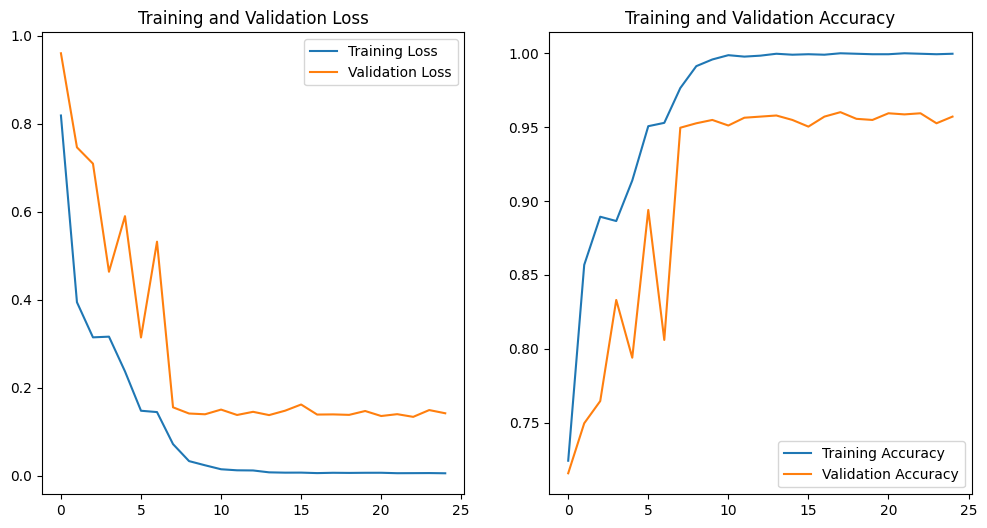

In [177]:
# Plotovanje gubitaka treninga i validacije
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Training Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Plotovanje preciznosti treninga i validacije
plt.subplot(1, 2, 2)
plt.plot(train_accs, label="Training Accuracy")
plt.plot(val_accs, label="Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.show()

## **Step 4: Model Evaluation**
Posle treninga na redu je evaluacija performansi preko metrika kao sto je preciznost i tacnost.

In [178]:
# Funkcija da se plotuje confusion matrica
def plot_confusion_matrix(
    cm, classes, normalize=False, title="Confusion matrix", cmap=plt.cm.Blues
):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    plt.imshow(cm, interpolation="nearest", cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = ".2f" if normalize else "d"
    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(
            j,
            i,
            format(cm[i, j], fmt),
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black",
        )

    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [179]:
# Evaluacija modela
model_ft.eval()  # rezim evaluacije

PlantSeedingModelResNet18(
  (resnet18): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, aff

In [180]:
y_true = []
y_pred = []

test_loader = DataLoader(test_dataset, batch_size=batch_size)


for inputs, labels in test_loader:
    inputs = inputs.to(device)
    labels = labels.to(device)

    outputs = model_ft(inputs)
    _, preds = torch.max(outputs, 1)

    y_true.extend(labels.cpu().numpy())
    y_pred.extend(preds.cpu().numpy())

# Racunanje metrika
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=subfolders))

Classification Report:

                           precision    recall  f1-score   support

              Black-grass       0.77      0.74      0.76        65
                 Charlock       0.99      1.00      0.99        93
                 Cleavers       0.97      0.96      0.97        72
         Common Chickweed       0.98      0.96      0.97       157
             Common wheat       0.90      0.98      0.94        45
                  Fat Hen       0.96      0.97      0.96        97
         Loose Silky-bent       0.90      0.93      0.91       168
                    Maize       0.98      0.98      0.98        47
        Scentless Mayweed       0.93      0.99      0.96        99
          Shepherds Purse       0.98      0.90      0.94        49
Small-flowered Cranesbill       1.00      0.99      1.00       117
               Sugar beet       0.97      0.91      0.94        99

                 accuracy                           0.95      1108
                macro avg       0.94

Normalized confusion matrix


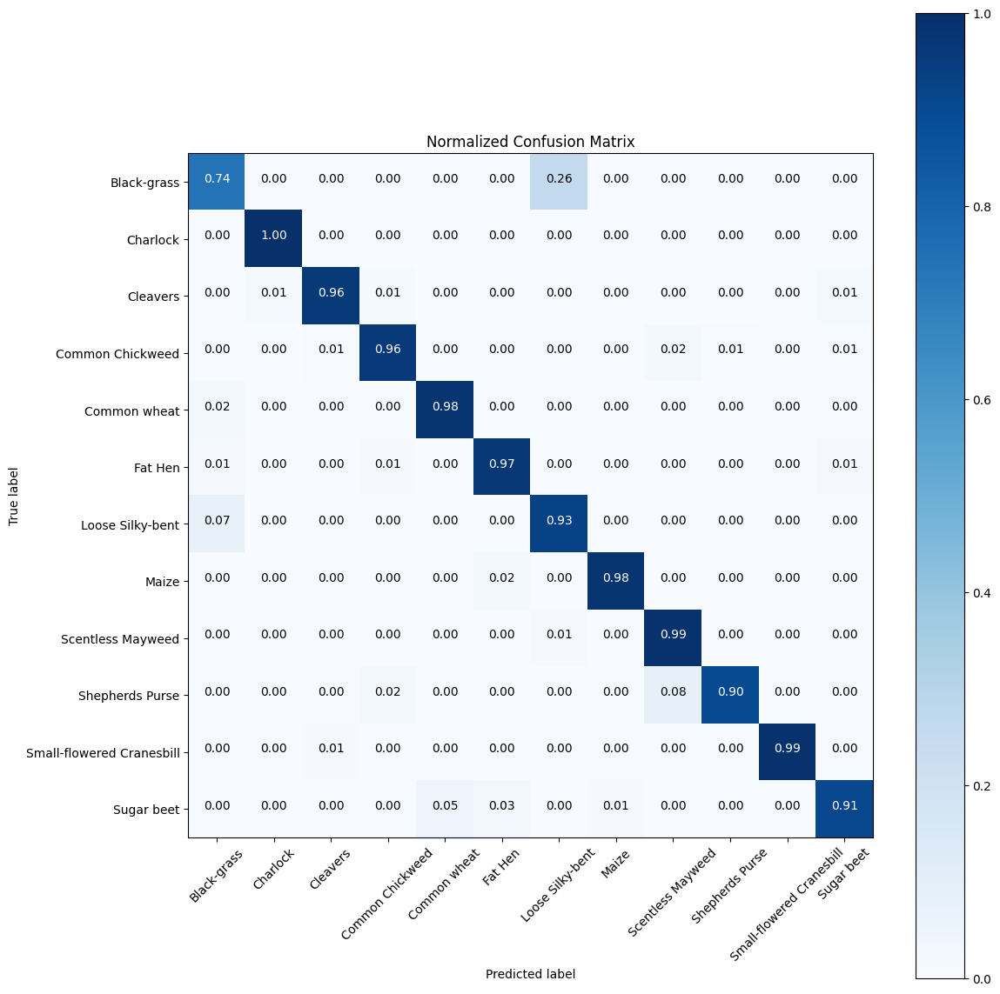

In [182]:
import itertools
# Racunanje confusion matrice
cm = confusion_matrix(y_true, y_pred)

# Plotovanje
plt.figure(figsize=(12, 12))
plot_confusion_matrix(
    cm, classes=subfolders, normalize=True, title="Normalized Confusion Matrix"
)

plt.show()

## **Step 5: Rezultati i Vizualizacija rezulata**
Konacno, predstavljamo rezulate. To ukljucuje vizualizaciju predikcije modela na slikama semena, intepretacija metrika performanse i koriscenje alata kao sto je LIME for explainable AI. Pomaze u razumevanju kako model odlucuje i daje uvid u efektivnost modela da klasifikuje razlicita semena biljaka.

In [183]:
# Funkcija za prikaz slike
def imshow(inp, ax=None, title=None):
    """Imshow for Tensor."""
    if ax is None:
        _, ax = plt.subplots(1)
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    ax.imshow(inp)
    if title is not None:
        ax.set_title(title)
    ax.grid(False)
    ax.axis("off")

In [184]:
# Rezulati i vizualizacija za sve klase u test setu
def visualize_classes(model, num_samples_per_class=3):
    class_images = {category: 0 for category in subfolders}
    fig, axes = plt.subplots(
        len(subfolders), num_samples_per_class, figsize=(15, 5 * len(subfolders))
    )

    model.eval()
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            probabilities = torch.nn.functional.softmax(outputs, dim=1)

            for i in range(inputs.size()[0]):
                label = subfolders[labels[i]]
                if class_images[label] < num_samples_per_class:
                    ax = axes[subfolders.index(label), class_images[label]]
                    imshow(inputs.cpu().data[i], ax=ax)
                    ax.set_title(
                        f"Ground Truth: {label}\nPrediction: {subfolders[preds[i]]} ({probabilities[i][preds[i]]:.2f})"
                    )
                    class_images[label] += 1

                if all(
                    value >= num_samples_per_class for value in class_images.values()
                ):
                    plt.tight_layout()
                    plt.show()
                    return

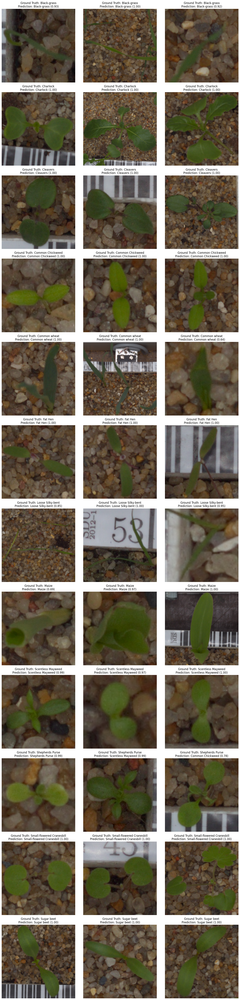

In [185]:
visualize_classes(model_ft)